# Load data

In [3]:
data_dir = '.';
load(sprintf('%s/data_simulation_11.mat',data_dir))

In [4]:
data_0 = permute(data_0, [3 2 1]);
data_1 = permute(data_1, [3 2 1]);

In [5]:
size(data_0), size(data_1)


ans =

        1000          25          50


ans =

        1000          25          50



In [6]:
num_trial = size(data_0, 1);
num_time = size(data_0, 3);

In [7]:
data = struct( ...
    'trialId', num2cell(1:num_trial), ...
    'T', num2cell(zeros(1,num_trial) + num_time), ...
    'y', cellfun(@(c) squeeze(c), num2cell(cat(2, data_0, data_1), [2 3])','UniformOutput',false) ...
)


data = 

  1×1000 struct array with fields:

    trialId
    T
    y



# Load external package

In [1]:
cd '../../../_external/DLAG/'

In [2]:
run("startup.m")

## Optional arguments

In [8]:
% Let's explicitly define all of the optional arguments, for 
% the sake of demonstration:
runIdx = 7;               % Results will be saved in baseDir/mat_results/runXXX/,  
                          % where XXX is runIdx. Use a new runIdx for each dataset.
baseDir = '.';            % Base directory where results will be saved
overwriteExisting = true; % Control whether existing results files are overwritten
saveData = false;         % Set to true to save train and test data (not recommended)
method = 'dlag';          % For now this is the only option, but that may change in the near future
binWidth = 1;            % Sample period / spike count bin width, in units of time (e.g., ms)
numFolds = 0;             % Number of cross-validation folds (0 means no cross-validation)
xDims_across = 1;         % This number of across-group latents matches the synthetic ground truth
xDims_within = {2, 2};    % These numbers match the within-group latents in the synthetic ground truth
yDims = [25 25];          % Number of observed features (neurons) in each group (area)
rGroups = [1 2];          % For performance evaluation, we can regress group 2's activity with group 1
startTau = 2*binWidth;    % Initial timescale, in the same units of time as binWidth
segLength = 50;           % Largest trial segment length, in no. of time points
init_method = 'static';   % Initialize DLAG with fitted pCCA parameters
learnDelays = true;       % Set to false if you want to fix delays at their initial value
maxIters = 5e5;           % Limit the number of EM iterations (not recommended for final fitting stage)
freqLL = 10;              % Check for data log-likelihood convergence every freqLL EM iterations
freqParam = 100;          % Store intermediate delay and timescale estimates every freqParam EM iterations
minVarFrac = 0.01;        % Private noise variances will not be allowed to go below this value
verbose = true;           % Toggle printed progress updates
randomSeed = 0;           % Seed the random number generator, for reproducibility

## Fitting DLAG

In [9]:
fit_dlag(runIdx, data, ...
         'baseDir', baseDir, ...
         'method', method, ...
         'binWidth', binWidth, ...
         'numFolds', numFolds, ...
         'xDims_across', xDims_across, ...
         'xDims_within', xDims_within, ...
         'yDims', yDims, ...
         'rGroups', rGroups,...
         'startTau', startTau, ...
         'segLength', segLength, ...
         'init_method', init_method, ...
         'learnDelays', learnDelays, ...
         'maxIters', maxIters, ...
         'freqLL', freqLL, ...
         'freqParam', freqParam, ...
         'minVarFrac', minVarFrac, ...
         'parallelize', false, ... % Only relevant for cross-validation
         'verbose', verbose, ...
         'randomSeed', randomSeed, ...
         'overwriteExisting', overwriteExisting, ...
         'saveData', saveData);


---------------------------------------
Making directory ./mat_results/run007...

===== Training on all data =====
Number of training trials: 1000
Number of test trials: 0
Across-group latent dimensionality: 1
Within-group latent dimensionalities: 2  2
Observation dimensionality: 50

Initializing DLAG using pCCA...
LL converged after 1219 EM iterations. 2215668.247073

Fitting DLAG model...
EM iteration   1 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration   2 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration   3 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration   4 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration   5 

EM iteration 110 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 111 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 112 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 113 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 114 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 115 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 116 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...

EM iteration 166 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 167 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 168 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 169 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 170 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 171 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 172 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...

EM iteration 222 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 223 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 224 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 225 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 226 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 227 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 228 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...

EM iteration 278 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 279 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 280 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 281 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 282 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 283 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 284 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...

EM iteration 334 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 335 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 336 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 337 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 338 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 339 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 340 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...

EM iteration 390 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 391 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 392 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 393 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 394 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 395 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 396 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...

EM iteration 446 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 447 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 448 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 449 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 450 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 451 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 452 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...

EM iteration 502 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 503 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 504 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 505 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 506 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 507 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 508 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...

EM iteration 558 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 559 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 560 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 561 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 562 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 563 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 564 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...

EM iteration 614 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 615 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 616 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 617 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 618 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 619 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 620 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...

EM iteration 670 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 671 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 672 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 673 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 674 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 675 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 676 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...

EM iteration 726 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 727 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 728 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 729 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 730 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 731 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 732 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...

EM iteration 782 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 783 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 784 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 785 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 786 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 787 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 788 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...

EM iteration 838 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 839 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 840 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 841 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 842 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 843 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 844 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...

EM iteration 894 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 895 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 896 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 897 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 898 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 899 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 900 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...

EM iteration 950 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 951 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 952 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 953 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 954 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 955 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 956 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...

EM iteration 1006 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1007 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1008 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1009 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1010 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1011 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1012 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1062 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1063 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1064 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1065 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1066 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1067 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1068 of 500000 MEX did not work in Paut

EM iteration 1117 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1118 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1119 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1120 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1121 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1122 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1123 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1173 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1174 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1175 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1176 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1177 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1178 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1179 of 500000 MEX did not work in Paut

EM iteration 1228 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1229 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1230 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1231 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1232 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1233 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1234 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1284 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1285 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1286 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1287 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1288 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1289 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1290 of 500000 MEX did not work in Paut

EM iteration 1339 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1340 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1341 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1342 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1343 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1344 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1345 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1395 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1396 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1397 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1398 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1399 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1400 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1401 of 500000 MEX did not work in Paut

EM iteration 1450 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1451 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1452 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1453 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1454 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1455 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1456 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1506 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1507 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1508 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1509 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1510 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1511 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1512 of 500000 MEX did not work in Paut

EM iteration 1561 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1562 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1563 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1564 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1565 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1566 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1567 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1617 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1618 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1619 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1620 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1621 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1622 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1623 of 500000 MEX did not work in Paut

EM iteration 1672 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1673 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1674 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1675 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1676 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1677 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1678 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1728 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1729 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1730 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1731 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1732 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1733 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1734 of 500000 MEX did not work in Paut

EM iteration 1783 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1784 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1785 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1786 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1787 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1788 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1789 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1839 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1840 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1841 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1842 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1843 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1844 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1845 of 500000 MEX did not work in Paut

EM iteration 1894 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1895 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1896 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1897 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1898 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1899 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1900 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1950 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1951 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1952 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1953 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1954 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1955 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 1956 of 500000 MEX did not work in Paut

EM iteration 2005 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2006 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2007 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2008 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2009 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2010 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2011 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2061 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2062 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2063 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2064 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2065 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2066 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2067 of 500000 MEX did not work in Paut

EM iteration 2116 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2117 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2118 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2119 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2120 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2121 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2122 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2172 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2173 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2174 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2175 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2176 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2177 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2178 of 500000 MEX did not work in Paut

EM iteration 2227 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2228 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2229 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2230 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2231 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2232 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2233 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2283 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2284 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2285 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2286 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2287 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2288 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2289 of 500000 MEX did not work in Paut

EM iteration 2338 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2339 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2340 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2341 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2342 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2343 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2344 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2394 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2395 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2396 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2397 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2398 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2399 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2400 of 500000 MEX did not work in Paut

EM iteration 2449 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2450 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2451 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2452 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2453 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2454 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2455 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2505 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2506 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2507 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2508 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2509 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2510 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2511 of 500000 MEX did not work in Paut

EM iteration 2560 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2561 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2562 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2563 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2564 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2565 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2566 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2616 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2617 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2618 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2619 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2620 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2621 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2622 of 500000 MEX did not work in Paut

EM iteration 2671 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2672 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2673 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2674 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2675 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2676 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2677 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2727 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2728 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2729 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2730 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2731 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2732 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2733 of 500000 MEX did not work in Paut

EM iteration 2782 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2783 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2784 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2785 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2786 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2787 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2788 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2838 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2839 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2840 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2841 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2842 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2843 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2844 of 500000 MEX did not work in Paut

EM iteration 2893 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2894 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2895 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2896 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2897 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2898 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2899 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2949 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2950 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2951 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2952 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2953 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2954 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 2955 of 500000 MEX did not work in Paut

EM iteration 3004 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3005 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3006 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3007 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3008 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3009 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3010 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3060 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3061 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3062 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3063 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3064 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3065 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3066 of 500000 MEX did not work in Paut

EM iteration 3115 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3116 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3117 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3118 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3119 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3120 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3121 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3171 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3172 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3173 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3174 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3175 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3176 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3177 of 500000 MEX did not work in Paut

EM iteration 3226 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3227 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3228 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3229 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3230 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3231 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3232 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3282 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3283 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3284 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3285 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3286 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3287 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3288 of 500000 MEX did not work in Paut

EM iteration 3337 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3338 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3339 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3340 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3341 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3342 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3343 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3393 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3394 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3395 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3396 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3397 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3398 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3399 of 500000 MEX did not work in Paut

EM iteration 3448 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3449 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3450 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3451 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3452 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3453 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3454 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3504 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3505 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3506 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3507 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3508 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3509 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3510 of 500000 MEX did not work in Paut

EM iteration 3559 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3560 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3561 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3562 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3563 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3564 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3565 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3615 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3616 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3617 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3618 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3619 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3620 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3621 of 500000 MEX did not work in Paut

EM iteration 3670 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3671 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3672 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3673 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3674 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3675 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3676 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3726 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3727 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3728 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3729 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3730 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3731 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3732 of 500000 MEX did not work in Paut

EM iteration 3781 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3782 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3783 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3784 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3785 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3786 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3787 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3837 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3838 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3839 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3840 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3841 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3842 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3843 of 500000 MEX did not work in Paut

EM iteration 3892 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3893 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3894 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3895 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3896 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3897 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3898 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3948 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3949 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3950 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3951 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3952 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3953 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 3954 of 500000 MEX did not work in Paut

EM iteration 4003 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4004 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4005 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4006 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4007 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4008 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4009 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4059 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4060 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4061 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4062 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4063 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4064 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4065 of 500000 MEX did not work in Paut

EM iteration 4114 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4115 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4116 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4117 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4118 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4119 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4120 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4170 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4171 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4172 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4173 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4174 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4175 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4176 of 500000 MEX did not work in Paut

EM iteration 4225 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4226 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4227 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4228 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4229 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4230 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4231 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4281 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4282 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4283 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4284 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4285 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4286 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4287 of 500000 MEX did not work in Paut

EM iteration 4336 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4337 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4338 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4339 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4340 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4341 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4342 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4392 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4393 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4394 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4395 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4396 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4397 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4398 of 500000 MEX did not work in Paut

EM iteration 4447 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4448 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4449 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4450 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4451 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4452 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4453 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4503 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4504 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4505 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4506 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4507 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4508 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4509 of 500000 MEX did not work in Paut

EM iteration 4558 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4559 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4560 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4561 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4562 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4563 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4564 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4614 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4615 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4616 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4617 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4618 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4619 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4620 of 500000 MEX did not work in Paut

EM iteration 4669 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4670 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4671 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4672 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4673 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4674 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4675 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4725 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4726 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4727 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4728 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4729 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4730 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4731 of 500000 MEX did not work in Paut

EM iteration 4780 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4781 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4782 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4783 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4784 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4785 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4786 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4836 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4837 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4838 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4839 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4840 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4841 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4842 of 500000 MEX did not work in Paut

EM iteration 4891 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4892 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4893 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4894 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4895 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4896 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4897 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4947 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4948 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4949 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4950 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4951 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4952 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 4953 of 500000 MEX did not work in Paut

EM iteration 5002 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5003 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5004 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5005 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5006 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5007 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5008 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5058 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5059 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5060 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5061 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5062 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5063 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5064 of 500000 MEX did not work in Paut

EM iteration 5113 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5114 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5115 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5116 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5117 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5118 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5119 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5169 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5170 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5171 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5172 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5173 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5174 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5175 of 500000 MEX did not work in Paut

EM iteration 5224 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5225 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5226 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5227 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5228 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5229 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5230 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5280 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5281 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5282 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5283 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5284 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5285 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5286 of 500000 MEX did not work in Paut

EM iteration 5335 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5336 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5337 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5338 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5339 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5340 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5341 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5391 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5392 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5393 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5394 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5395 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5396 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5397 of 500000 MEX did not work in Paut

EM iteration 5446 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5447 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5448 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5449 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5450 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5451 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5452 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5502 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5503 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5504 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5505 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5506 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5507 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5508 of 500000 MEX did not work in Paut

EM iteration 5557 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5558 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5559 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5560 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5561 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5562 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5563 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5613 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5614 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5615 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5616 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5617 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5618 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5619 of 500000 MEX did not work in Paut

EM iteration 5668 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5669 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5670 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5671 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5672 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5673 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5674 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5724 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5725 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5726 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5727 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5728 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5729 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5730 of 500000 MEX did not work in Paut

EM iteration 5779 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5780 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5781 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5782 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5783 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5784 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5785 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5835 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5836 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5837 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5838 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5839 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5840 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5841 of 500000 MEX did not work in Paut

EM iteration 5890 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5891 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5892 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5893 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5894 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5895 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5896 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5946 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5947 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5948 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5949 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5950 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5951 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 5952 of 500000 MEX did not work in Paut

EM iteration 6001 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6002 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6003 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6004 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6005 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6006 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6007 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6057 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6058 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6059 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6060 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6061 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6062 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6063 of 500000 MEX did not work in Paut

EM iteration 6112 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6113 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6114 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6115 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6116 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6117 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6118 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6168 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6169 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6170 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6171 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6172 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6173 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6174 of 500000 MEX did not work in Paut

EM iteration 6223 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6224 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6225 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6226 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6227 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6228 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6229 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6279 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6280 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6281 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6282 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6283 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6284 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6285 of 500000 MEX did not work in Paut

EM iteration 6334 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6335 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6336 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6337 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6338 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6339 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6340 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6390 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6391 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6392 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6393 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6394 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6395 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6396 of 500000 MEX did not work in Paut

EM iteration 6445 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6446 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6447 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6448 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6449 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6450 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6451 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6501 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6502 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6503 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6504 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6505 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6506 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6507 of 500000 MEX did not work in Paut

EM iteration 6556 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6557 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6558 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6559 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6560 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6561 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6562 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6612 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6613 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6614 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6615 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6616 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6617 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6618 of 500000 MEX did not work in Paut

EM iteration 6667 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6668 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6669 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6670 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6671 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6672 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6673 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6723 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6724 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6725 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6726 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6727 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6728 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6729 of 500000 MEX did not work in Paut

EM iteration 6778 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6779 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6780 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6781 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6782 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6783 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6784 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6834 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6835 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6836 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6837 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6838 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6839 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6840 of 500000 MEX did not work in Paut

EM iteration 6889 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6890 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6891 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6892 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6893 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6894 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6895 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6945 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6946 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6947 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6948 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6949 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6950 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 6951 of 500000 MEX did not work in Paut

EM iteration 7000 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7001 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7002 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7003 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7004 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7005 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7006 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7056 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7057 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7058 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7059 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7060 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7061 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7062 of 500000 MEX did not work in Paut

EM iteration 7111 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7112 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7113 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7114 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7115 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7116 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7117 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7167 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7168 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7169 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7170 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7171 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7172 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7173 of 500000 MEX did not work in Paut

EM iteration 7222 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7223 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7224 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7225 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7226 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7227 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7228 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7278 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7279 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7280 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7281 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7282 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7283 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7284 of 500000 MEX did not work in Paut

EM iteration 7333 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7334 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7335 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7336 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7337 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7338 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7339 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7389 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7390 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7391 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7392 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7393 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7394 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7395 of 500000 MEX did not work in Paut

EM iteration 7444 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7445 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7446 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7447 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7448 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7449 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7450 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7500 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7501 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7502 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7503 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7504 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7505 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7506 of 500000 MEX did not work in Paut

EM iteration 7555 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7556 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7557 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7558 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7559 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7560 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7561 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7611 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7612 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7613 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7614 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7615 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7616 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7617 of 500000 MEX did not work in Paut

EM iteration 7666 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7667 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7668 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7669 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7670 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7671 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7672 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7722 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7723 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7724 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7725 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7726 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7727 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7728 of 500000 MEX did not work in Paut

EM iteration 7777 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7778 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7779 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7780 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7781 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7782 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7783 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7833 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7834 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7835 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7836 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7837 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7838 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7839 of 500000 MEX did not work in Paut

EM iteration 7888 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7889 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7890 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7891 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7892 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7893 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7894 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7944 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7945 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7946 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7947 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7948 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7949 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 7950 of 500000 MEX did not work in Paut

EM iteration 7999 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8000 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8001 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8002 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8003 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8004 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8005 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8055 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8056 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8057 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8058 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8059 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8060 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8061 of 500000 MEX did not work in Paut

EM iteration 8110 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8111 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8112 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8113 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8114 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8115 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8116 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8166 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8167 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8168 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8169 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8170 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8171 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8172 of 500000 MEX did not work in Paut

EM iteration 8221 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8222 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8223 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8224 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8225 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8226 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8227 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8277 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8278 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8279 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8280 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8281 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8282 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8283 of 500000 MEX did not work in Paut

EM iteration 8332 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8333 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8334 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8335 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8336 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8337 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8338 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8388 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8389 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8390 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8391 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8392 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8393 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8394 of 500000 MEX did not work in Paut

EM iteration 8443 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8444 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8445 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8446 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8447 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8448 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8449 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8499 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8500 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8501 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8502 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8503 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8504 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8505 of 500000 MEX did not work in Paut

EM iteration 8554 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8555 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8556 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8557 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8558 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8559 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8560 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8610 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8611 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8612 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8613 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8614 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8615 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8616 of 500000 MEX did not work in Paut

EM iteration 8665 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8666 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8667 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8668 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8669 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8670 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8671 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8721 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8722 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8723 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8724 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8725 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8726 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8727 of 500000 MEX did not work in Paut

EM iteration 8776 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8777 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8778 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8779 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8780 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8781 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8782 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8832 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8833 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8834 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8835 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8836 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8837 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8838 of 500000 MEX did not work in Paut

EM iteration 8887 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8888 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8889 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8890 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8891 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8892 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8893 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8943 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8944 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8945 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8946 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8947 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8948 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8949 of 500000 MEX did not work in Paut

EM iteration 8998 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 8999 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9000 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9001 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9002 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9003 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9004 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9054 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9055 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9056 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9057 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9058 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9059 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9060 of 500000 MEX did not work in Paut

EM iteration 9109 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9110 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9111 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9112 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9113 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9114 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9115 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9165 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9166 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9167 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9168 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9169 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9170 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9171 of 500000 MEX did not work in Paut

EM iteration 9220 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9221 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9222 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9223 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9224 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9225 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9226 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9276 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9277 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9278 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9279 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9280 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9281 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9282 of 500000 MEX did not work in Paut

EM iteration 9331 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9332 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9333 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9334 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9335 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9336 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9337 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9387 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9388 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9389 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9390 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9391 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9392 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9393 of 500000 MEX did not work in Paut

EM iteration 9442 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9443 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9444 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9445 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9446 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9447 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9448 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9498 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9499 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9500 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9501 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9502 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9503 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9504 of 500000 MEX did not work in Paut

EM iteration 9553 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9554 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9555 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9556 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9557 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9558 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9559 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9609 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9610 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9611 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9612 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9613 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9614 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9615 of 500000 MEX did not work in Paut

EM iteration 9664 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9665 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9666 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9667 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9668 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9669 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9670 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9720 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9721 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9722 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9723 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9724 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9725 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9726 of 500000 MEX did not work in Paut

EM iteration 9775 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9776 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9777 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9778 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9779 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9780 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9781 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9831 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9832 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9833 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9834 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9835 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9836 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9837 of 500000 MEX did not work in Paut

EM iteration 9886 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9887 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9888 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9889 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9890 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9891 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9892 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in Paut

MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9942 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9943 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9944 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9945 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9946 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9947 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9948 of 500000 MEX did not work in Paut

EM iteration 9997 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9998 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 9999 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10000 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10001 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10002 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10003 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in 

EM iteration 10107 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10108 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10109 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10110 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10111 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10112 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10113 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 10162 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10163 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10164 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10165 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10166 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10167 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10168 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 10217 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10218 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10219 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10220 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10221 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10222 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10223 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 10272 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10273 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10274 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10275 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10276 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10277 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10278 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 10327 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10328 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10329 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10330 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10331 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10332 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10333 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 10382 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10383 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10384 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10385 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10386 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10387 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10388 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 10437 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10438 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10439 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10440 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10441 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10442 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10443 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 10492 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10493 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10494 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10495 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10496 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10497 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10498 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 10547 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10548 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10549 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10550 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10551 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10552 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10553 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 10602 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10603 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10604 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10605 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10606 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10607 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10608 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 10657 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10658 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10659 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10660 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10661 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10662 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10663 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 10712 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10713 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10714 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10715 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10716 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10717 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10718 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 10767 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10768 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10769 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10770 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10771 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10772 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10773 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 10822 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10823 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10824 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10825 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10826 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10827 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10828 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 10877 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10878 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10879 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10880 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10881 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10882 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10883 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 10932 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10933 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10934 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10935 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10936 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10937 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10938 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 10987 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10988 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10989 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10990 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10991 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10992 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 10993 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 11042 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11043 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11044 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11045 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11046 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11047 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11048 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 11097 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11098 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11099 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11100 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11101 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11102 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11103 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 11152 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11153 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11154 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11155 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11156 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11157 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11158 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 11207 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11208 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11209 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11210 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11211 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11212 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11213 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 11262 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11263 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11264 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11265 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11266 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11267 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11268 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 11317 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11318 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11319 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11320 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11321 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11322 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11323 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 11372 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11373 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11374 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11375 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11376 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11377 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11378 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 11427 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11428 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11429 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11430 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11431 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11432 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11433 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 11482 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11483 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11484 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11485 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11486 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11487 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11488 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 11537 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11538 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11539 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11540 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11541 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11542 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11543 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 11592 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11593 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11594 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11595 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11596 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11597 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11598 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 11647 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11648 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11649 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11650 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11651 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11652 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11653 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 11702 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11703 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11704 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11705 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11706 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11707 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11708 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 11757 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11758 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11759 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11760 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11761 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11762 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11763 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 11812 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11813 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11814 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11815 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11816 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11817 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11818 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 11867 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11868 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11869 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11870 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11871 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11872 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11873 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 11922 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11923 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11924 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11925 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11926 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11927 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11928 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 11977 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11978 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11979 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11980 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11981 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11982 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 11983 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 12032 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12033 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12034 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12035 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12036 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12037 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12038 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 12087 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12088 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12089 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12090 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12091 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12092 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12093 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 12142 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12143 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12144 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12145 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12146 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12147 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12148 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 12197 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12198 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12199 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12200 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12201 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12202 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12203 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 12252 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12253 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12254 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12255 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12256 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12257 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12258 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 12307 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12308 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12309 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12310 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12311 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12312 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12313 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 12362 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12363 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12364 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12365 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12366 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12367 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12368 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 12417 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12418 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12419 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12420 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12421 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12422 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12423 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 12472 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12473 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12474 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12475 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12476 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12477 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12478 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 12527 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12528 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12529 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12530 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12531 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12532 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12533 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 12582 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12583 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12584 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12585 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12586 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12587 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12588 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 12637 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12638 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12639 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12640 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12641 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12642 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12643 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 12692 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12693 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12694 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12695 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12696 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12697 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12698 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 12747 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12748 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12749 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12750 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12751 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12752 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12753 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 12802 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12803 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12804 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12805 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12806 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12807 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12808 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 12857 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12858 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12859 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12860 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12861 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12862 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12863 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 12912 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12913 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12914 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12915 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12916 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12917 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12918 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 12967 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12968 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12969 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12970 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12971 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12972 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 12973 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 13022 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13023 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13024 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13025 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13026 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13027 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13028 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 13077 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13078 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13079 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13080 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13081 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13082 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13083 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 13132 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13133 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13134 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13135 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13136 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13137 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13138 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 13187 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13188 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13189 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13190 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13191 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13192 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13193 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 13242 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13243 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13244 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13245 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13246 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13247 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13248 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 13297 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13298 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13299 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13300 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13301 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13302 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13303 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 13352 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13353 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13354 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13355 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13356 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13357 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13358 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 13407 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13408 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13409 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13410 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13411 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13412 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13413 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 13462 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13463 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13464 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13465 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13466 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13467 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13468 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 13517 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13518 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13519 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13520 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13521 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13522 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13523 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 13572 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13573 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13574 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13575 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13576 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13577 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13578 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 13627 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13628 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13629 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13630 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13631 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13632 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13633 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 13682 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13683 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13684 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13685 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13686 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13687 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13688 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 13737 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13738 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13739 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13740 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13741 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13742 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13743 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 13792 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13793 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13794 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13795 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13796 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13797 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13798 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 13847 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13848 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13849 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13850 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13851 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13852 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13853 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 13902 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13903 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13904 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13905 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13906 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13907 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13908 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 13957 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13958 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13959 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13960 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13961 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13962 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 13963 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 14012 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14013 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14014 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14015 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14016 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14017 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14018 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 14067 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14068 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14069 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14070 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14071 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14072 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14073 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 14122 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14123 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14124 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14125 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14126 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14127 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14128 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 14177 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14178 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14179 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14180 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14181 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14182 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14183 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 14232 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14233 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14234 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14235 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14236 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14237 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14238 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 14287 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14288 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14289 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14290 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14291 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14292 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14293 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 14342 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14343 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14344 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14345 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14346 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14347 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14348 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 14397 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14398 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14399 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14400 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14401 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14402 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14403 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 14452 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14453 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14454 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14455 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14456 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14457 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14458 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 14507 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14508 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14509 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14510 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14511 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14512 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14513 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 14562 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14563 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14564 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14565 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14566 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14567 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14568 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 14617 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14618 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14619 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14620 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14621 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14622 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14623 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 14672 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14673 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14674 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14675 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14676 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14677 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14678 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 14727 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14728 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14729 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14730 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14731 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14732 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14733 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 14782 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14783 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14784 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14785 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14786 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14787 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14788 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 14837 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14838 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14839 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14840 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14841 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14842 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14843 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 14892 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14893 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14894 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14895 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14896 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14897 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14898 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 14947 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14948 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14949 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14950 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14951 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14952 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 14953 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 15002 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15003 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15004 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15005 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15006 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15007 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15008 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 15057 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15058 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15059 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15060 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15061 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15062 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15063 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 15112 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15113 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15114 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15115 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15116 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15117 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15118 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 15167 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15168 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15169 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15170 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15171 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15172 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15173 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 15222 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15223 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15224 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15225 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15226 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15227 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15228 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 15277 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15278 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15279 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15280 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15281 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15282 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15283 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 15332 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15333 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15334 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15335 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15336 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15337 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15338 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 15387 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15388 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15389 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15390 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15391 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15392 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15393 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 15442 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15443 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15444 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15445 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15446 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15447 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15448 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 15497 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15498 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15499 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15500 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15501 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15502 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15503 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 15552 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15553 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15554 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15555 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15556 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15557 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15558 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 15607 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15608 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15609 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15610 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15611 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15612 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15613 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 15662 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15663 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15664 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15665 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15666 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15667 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15668 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 15717 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15718 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15719 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15720 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15721 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15722 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15723 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 15772 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15773 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15774 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15775 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15776 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15777 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15778 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 15827 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15828 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15829 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15830 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15831 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15832 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15833 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 15882 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15883 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15884 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15885 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15886 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15887 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15888 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 15937 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15938 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15939 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15940 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15941 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15942 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15943 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 15992 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15993 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15994 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15995 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15996 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15997 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 15998 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 16047 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16048 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16049 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16050 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16051 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16052 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16053 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 16102 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16103 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16104 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16105 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16106 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16107 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16108 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 16157 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16158 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16159 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16160 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16161 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16162 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16163 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 16212 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16213 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16214 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16215 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16216 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16217 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16218 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 16267 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16268 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16269 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16270 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16271 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16272 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16273 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 16322 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16323 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16324 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16325 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16326 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16327 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16328 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 16377 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16378 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16379 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16380 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16381 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16382 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16383 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 16432 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16433 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16434 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16435 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16436 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16437 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16438 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 16487 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16488 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16489 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16490 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16491 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16492 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16493 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 16542 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16543 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16544 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16545 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16546 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16547 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16548 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 16597 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16598 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16599 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16600 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16601 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16602 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16603 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 16652 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16653 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16654 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16655 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16656 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16657 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16658 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 16707 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16708 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16709 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16710 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16711 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16712 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16713 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 16762 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16763 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16764 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16765 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16766 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16767 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16768 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 16817 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16818 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16819 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16820 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16821 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16822 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16823 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 16872 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16873 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16874 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16875 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16876 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16877 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16878 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 16927 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16928 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16929 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16930 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16931 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16932 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16933 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 16982 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16983 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16984 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16985 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16986 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16987 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 16988 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 17037 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17038 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17039 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17040 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17041 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17042 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17043 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 17092 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17093 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17094 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17095 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17096 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17097 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17098 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 17147 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17148 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17149 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17150 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17151 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17152 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17153 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 17202 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17203 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17204 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17205 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17206 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17207 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17208 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 17257 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17258 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17259 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17260 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17261 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17262 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17263 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 17312 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17313 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17314 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17315 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17316 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17317 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17318 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 17367 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17368 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17369 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17370 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17371 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17372 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17373 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 17422 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17423 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17424 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17425 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17426 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17427 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17428 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 17477 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17478 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17479 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17480 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17481 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17482 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17483 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 17532 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17533 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17534 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17535 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17536 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17537 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17538 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 17587 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17588 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17589 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17590 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17591 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17592 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17593 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 17642 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17643 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17644 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17645 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17646 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17647 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17648 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 17697 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17698 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17699 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17700 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17701 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17702 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17703 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 17752 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17753 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17754 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17755 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17756 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17757 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17758 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 17807 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17808 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17809 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17810 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17811 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17812 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17813 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 17862 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17863 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17864 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17865 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17866 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17867 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17868 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 17917 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17918 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17919 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17920 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17921 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17922 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17923 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 17972 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17973 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17974 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17975 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17976 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17977 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 17978 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 18027 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18028 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18029 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18030 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18031 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18032 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18033 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 18082 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18083 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18084 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18085 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18086 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18087 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18088 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 18137 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18138 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18139 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18140 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18141 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18142 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18143 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 18192 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18193 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18194 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18195 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18196 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18197 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18198 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 18247 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18248 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18249 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18250 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18251 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18252 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18253 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 18302 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18303 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18304 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18305 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18306 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18307 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18308 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 18357 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18358 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18359 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18360 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18361 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18362 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18363 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 18412 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18413 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18414 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18415 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18416 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18417 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18418 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 18467 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18468 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18469 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18470 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18471 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18472 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18473 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 18522 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18523 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18524 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18525 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18526 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18527 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18528 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 18577 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18578 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18579 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18580 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18581 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18582 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18583 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 18632 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18633 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18634 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18635 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18636 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18637 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18638 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 18687 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18688 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18689 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18690 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18691 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18692 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18693 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 18742 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18743 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18744 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18745 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18746 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18747 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18748 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 18797 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18798 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18799 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18800 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18801 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18802 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18803 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 18852 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18853 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18854 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18855 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18856 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18857 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18858 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 18907 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18908 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18909 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18910 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18911 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18912 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18913 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 18962 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18963 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18964 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18965 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18966 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18967 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 18968 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 19017 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19018 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19019 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19020 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19021 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19022 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19023 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 19072 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19073 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19074 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19075 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19076 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19077 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19078 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 19127 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19128 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19129 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19130 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19131 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19132 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19133 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 19182 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19183 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19184 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19185 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19186 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19187 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19188 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 19237 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19238 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19239 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19240 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19241 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19242 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19243 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 19292 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19293 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19294 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19295 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19296 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19297 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19298 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 19347 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19348 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19349 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19350 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19351 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19352 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19353 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 19402 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19403 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19404 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19405 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19406 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19407 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19408 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 19457 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19458 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19459 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19460 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19461 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19462 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19463 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 19512 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19513 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19514 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19515 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19516 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19517 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19518 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 19567 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19568 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19569 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19570 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19571 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19572 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19573 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 19622 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19623 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19624 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19625 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19626 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19627 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19628 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 19677 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19678 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19679 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19680 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19681 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19682 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19683 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 19732 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19733 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19734 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19735 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19736 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19737 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19738 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 19787 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19788 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19789 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19790 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19791 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19792 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19793 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 19842 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19843 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19844 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19845 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19846 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19847 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19848 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 19897 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19898 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19899 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19900 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19901 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19902 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19903 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 19952 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19953 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19954 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19955 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19956 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19957 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 19958 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 20007 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20008 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20009 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20010 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20011 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20012 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20013 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 20062 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20063 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20064 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20065 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20066 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20067 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20068 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 20117 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20118 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20119 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20120 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20121 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20122 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20123 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 20172 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20173 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20174 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20175 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20176 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20177 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20178 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 20227 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20228 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20229 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20230 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20231 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20232 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20233 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 20282 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20283 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20284 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20285 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20286 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20287 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20288 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 20337 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20338 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20339 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20340 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20341 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20342 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20343 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 20392 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20393 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20394 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20395 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20396 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20397 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20398 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 20447 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20448 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20449 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20450 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20451 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20452 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20453 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 20502 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20503 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20504 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20505 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20506 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20507 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20508 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 20557 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20558 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20559 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20560 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20561 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20562 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20563 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 20612 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20613 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20614 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20615 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20616 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20617 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20618 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 20667 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20668 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20669 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20670 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20671 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20672 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20673 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 20722 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20723 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20724 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20725 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20726 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20727 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20728 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 20777 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20778 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20779 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20780 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20781 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20782 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20783 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 20832 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20833 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20834 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20835 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20836 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20837 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20838 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 20887 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20888 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20889 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20890 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20891 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20892 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20893 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 20942 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20943 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20944 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20945 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20946 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20947 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20948 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 20997 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20998 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 20999 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21000 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21001 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21002 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21003 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 21052 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21053 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21054 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21055 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21056 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21057 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21058 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 21107 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21108 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21109 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21110 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21111 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21112 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21113 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 21162 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21163 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21164 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21165 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21166 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21167 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21168 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 21217 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21218 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21219 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21220 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21221 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21222 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21223 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 21272 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21273 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21274 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21275 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21276 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21277 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21278 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 21327 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21328 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21329 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21330 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21331 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21332 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21333 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 21382 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21383 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21384 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21385 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21386 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21387 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21388 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 21437 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21438 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21439 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21440 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21441 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21442 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21443 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 21492 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21493 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21494 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21495 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21496 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21497 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21498 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 21547 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21548 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21549 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21550 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21551 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21552 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21553 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 21602 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21603 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21604 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21605 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21606 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21607 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21608 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 21657 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21658 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21659 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21660 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21661 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21662 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21663 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 21712 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21713 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21714 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21715 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21716 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21717 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21718 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 21767 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21768 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21769 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21770 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21771 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21772 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21773 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 21822 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21823 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21824 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21825 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21826 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21827 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21828 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 21877 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21878 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21879 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21880 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21881 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21882 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21883 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 21932 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21933 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21934 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21935 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21936 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21937 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21938 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 21987 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21988 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21989 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21990 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21991 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21992 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 21993 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 22042 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22043 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22044 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22045 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22046 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22047 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22048 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 22097 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22098 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22099 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22100 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22101 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22102 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22103 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 22152 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22153 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22154 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22155 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22156 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22157 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22158 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 22207 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22208 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22209 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22210 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22211 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22212 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22213 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 22262 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22263 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22264 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22265 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22266 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22267 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22268 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 22317 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22318 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22319 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22320 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22321 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22322 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22323 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 22372 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22373 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22374 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22375 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22376 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22377 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22378 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 22427 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22428 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22429 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22430 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22431 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22432 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22433 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 22482 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22483 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22484 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22485 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22486 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22487 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22488 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 22537 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22538 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22539 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22540 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22541 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22542 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22543 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 22592 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22593 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22594 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22595 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22596 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22597 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22598 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 22647 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22648 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22649 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22650 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22651 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22652 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22653 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 22702 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22703 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22704 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22705 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22706 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22707 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22708 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 22757 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22758 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22759 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22760 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22761 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22762 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22763 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 22812 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22813 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22814 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22815 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22816 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22817 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22818 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 22867 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22868 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22869 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22870 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22871 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22872 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22873 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 22922 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22923 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22924 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22925 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22926 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22927 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22928 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 22977 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22978 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22979 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22980 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22981 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22982 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 22983 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 23032 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23033 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23034 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23035 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23036 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23037 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23038 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 23087 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23088 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23089 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23090 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23091 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23092 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23093 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 23142 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23143 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23144 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23145 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23146 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23147 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23148 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 23197 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23198 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23199 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23200 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23201 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23202 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23203 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 23252 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23253 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23254 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23255 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23256 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23257 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23258 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 23307 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23308 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23309 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23310 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23311 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23312 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23313 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 23362 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23363 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23364 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23365 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23366 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23367 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23368 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 23417 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23418 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23419 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23420 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23421 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23422 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23423 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 23472 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23473 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23474 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23475 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23476 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23477 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23478 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 23527 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23528 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23529 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23530 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23531 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23532 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23533 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 23582 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23583 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23584 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23585 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23586 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23587 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23588 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 23637 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23638 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23639 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23640 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23641 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23642 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23643 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 23692 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23693 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23694 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23695 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23696 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23697 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23698 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 23747 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23748 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23749 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23750 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23751 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23752 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23753 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 23802 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23803 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23804 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23805 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23806 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23807 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23808 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 23857 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23858 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23859 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23860 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23861 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23862 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23863 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 23912 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23913 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23914 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23915 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23916 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23917 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23918 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 23967 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23968 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23969 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23970 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23971 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23972 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 23973 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 24022 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24023 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24024 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24025 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24026 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24027 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24028 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 24077 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24078 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24079 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24080 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24081 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24082 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24083 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 24132 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24133 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24134 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24135 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24136 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24137 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24138 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 24187 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24188 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24189 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24190 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24191 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24192 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24193 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 24242 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24243 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24244 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24245 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24246 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24247 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24248 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 24297 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24298 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24299 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24300 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24301 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24302 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24303 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 24352 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24353 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24354 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24355 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24356 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24357 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24358 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 24407 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24408 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24409 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24410 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24411 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24412 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24413 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 24462 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24463 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24464 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24465 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24466 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24467 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24468 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 24517 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24518 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24519 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24520 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24521 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24522 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24523 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 24572 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24573 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24574 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24575 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24576 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24577 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24578 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 24627 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24628 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24629 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24630 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24631 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24632 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24633 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 24682 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24683 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24684 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24685 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24686 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24687 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24688 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 24737 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24738 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24739 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24740 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24741 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24742 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24743 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 24792 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24793 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24794 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24795 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24796 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24797 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24798 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 24847 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24848 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24849 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24850 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24851 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24852 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24853 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 24902 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24903 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24904 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24905 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24906 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24907 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24908 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 24957 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24958 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24959 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24960 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24961 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24962 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 24963 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 25012 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25013 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25014 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25015 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25016 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25017 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25018 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 25067 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25068 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25069 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25070 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25071 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25072 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25073 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 25122 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25123 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25124 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25125 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25126 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25127 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25128 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 25177 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25178 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25179 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25180 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25181 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25182 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25183 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 25232 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25233 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25234 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25235 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25236 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25237 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25238 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 25287 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25288 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25289 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25290 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25291 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25292 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25293 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 25342 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25343 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25344 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25345 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25346 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25347 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25348 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 25397 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25398 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25399 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25400 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25401 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25402 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25403 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 25452 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25453 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25454 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25455 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25456 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25457 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25458 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 25507 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25508 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25509 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25510 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25511 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25512 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25513 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 25562 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25563 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25564 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25565 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25566 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25567 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25568 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 25617 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25618 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25619 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25620 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25621 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25622 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25623 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 25672 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25673 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25674 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25675 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25676 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25677 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25678 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 25727 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25728 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25729 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25730 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25731 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25732 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25733 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 25782 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25783 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25784 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25785 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25786 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25787 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25788 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 25837 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25838 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25839 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25840 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25841 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25842 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25843 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 25892 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25893 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25894 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25895 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25896 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25897 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25898 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 25947 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25948 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25949 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25950 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25951 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25952 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 25953 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 26002 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26003 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26004 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26005 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26006 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26007 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26008 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 26057 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26058 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26059 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26060 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26061 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26062 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26063 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 26112 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26113 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26114 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26115 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26116 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26117 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26118 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 26167 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26168 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26169 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26170 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26171 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26172 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26173 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 26222 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26223 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26224 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26225 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26226 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26227 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26228 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 26277 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26278 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26279 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26280 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26281 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26282 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26283 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 26332 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26333 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26334 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26335 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26336 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26337 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26338 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 26387 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26388 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26389 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26390 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26391 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26392 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26393 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 26442 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26443 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26444 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26445 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26446 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26447 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26448 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 26497 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26498 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26499 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26500 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26501 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26502 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26503 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 26552 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26553 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26554 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26555 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26556 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26557 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26558 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 26607 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26608 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26609 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26610 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26611 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26612 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26613 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 26662 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26663 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26664 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26665 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26666 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26667 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26668 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 26717 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26718 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26719 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26720 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26721 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26722 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26723 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 26772 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26773 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26774 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26775 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26776 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26777 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26778 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 26827 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26828 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26829 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26830 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26831 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26832 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26833 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 26882 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26883 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26884 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26885 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26886 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26887 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26888 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 26937 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26938 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26939 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26940 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26941 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26942 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26943 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 26992 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26993 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26994 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26995 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26996 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26997 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 26998 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 27047 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27048 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27049 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27050 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27051 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27052 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27053 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 27102 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27103 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27104 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27105 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27106 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27107 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27108 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 27157 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27158 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27159 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27160 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27161 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27162 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27163 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 27212 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27213 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27214 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27215 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27216 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27217 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27218 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 27267 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27268 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27269 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27270 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27271 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27272 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27273 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 27322 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27323 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27324 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27325 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27326 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27327 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27328 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 27377 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27378 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27379 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27380 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27381 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27382 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27383 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 27432 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27433 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27434 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27435 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27436 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27437 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27438 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 27487 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27488 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27489 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27490 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27491 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27492 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27493 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 27542 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27543 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27544 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27545 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27546 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27547 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27548 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 27597 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27598 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27599 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27600 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27601 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27602 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27603 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 27652 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27653 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27654 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27655 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27656 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27657 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27658 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 27707 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27708 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27709 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27710 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27711 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27712 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27713 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 27762 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27763 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27764 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27765 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27766 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27767 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27768 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 27817 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27818 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27819 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27820 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27821 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27822 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27823 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 27872 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27873 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27874 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27875 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27876 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27877 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27878 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 27927 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27928 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27929 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27930 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27931 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27932 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27933 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 27982 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27983 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27984 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27985 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27986 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27987 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 27988 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 28037 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28038 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28039 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28040 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28041 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28042 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28043 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 28092 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28093 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28094 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28095 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28096 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28097 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28098 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 28147 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28148 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28149 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28150 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28151 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28152 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28153 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 28202 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28203 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28204 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28205 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28206 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28207 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28208 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 28257 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28258 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28259 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28260 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28261 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28262 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28263 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 28312 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28313 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28314 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28315 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28316 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28317 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28318 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 28367 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28368 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28369 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28370 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28371 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28372 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28373 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 28422 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28423 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28424 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28425 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28426 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28427 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28428 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 28477 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28478 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28479 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28480 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28481 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28482 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28483 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 28532 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28533 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28534 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28535 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28536 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28537 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28538 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 28587 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28588 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28589 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28590 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28591 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28592 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28593 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 28642 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28643 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28644 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28645 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28646 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28647 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28648 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 28697 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28698 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28699 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28700 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28701 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28702 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28703 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 28752 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28753 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28754 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28755 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28756 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28757 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28758 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 28807 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28808 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28809 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28810 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28811 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28812 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28813 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 28862 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28863 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28864 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28865 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28866 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28867 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28868 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 28917 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28918 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28919 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28920 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28921 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28922 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28923 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 28972 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28973 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28974 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28975 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28976 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28977 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 28978 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 29027 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29028 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29029 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29030 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29031 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29032 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29033 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 29082 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29083 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29084 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29085 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29086 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29087 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29088 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 29137 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29138 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29139 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29140 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29141 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29142 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29143 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 29192 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29193 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29194 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29195 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29196 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29197 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29198 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 29247 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29248 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29249 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29250 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29251 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29252 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29253 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 29302 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29303 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29304 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29305 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29306 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29307 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29308 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 29357 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29358 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29359 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29360 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29361 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29362 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29363 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 29412 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29413 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29414 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29415 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29416 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29417 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29418 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 29467 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29468 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29469 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29470 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29471 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29472 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29473 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 29522 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29523 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29524 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29525 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29526 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29527 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29528 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 29577 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29578 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29579 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29580 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29581 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29582 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29583 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 29632 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29633 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29634 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29635 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29636 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29637 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29638 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 29687 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29688 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29689 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29690 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29691 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29692 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29693 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 29742 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29743 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29744 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29745 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29746 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29747 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29748 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 29797 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29798 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29799 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29800 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29801 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29802 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29803 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 29852 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29853 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29854 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29855 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29856 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29857 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29858 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 29907 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29908 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29909 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29910 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29911 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29912 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29913 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 29962 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29963 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29964 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29965 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29966 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29967 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 29968 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 30017 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30018 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30019 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30020 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30021 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30022 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30023 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 30072 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30073 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30074 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30075 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30076 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30077 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30078 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 30127 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30128 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30129 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30130 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30131 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30132 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30133 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 30182 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30183 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30184 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30185 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30186 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30187 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30188 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 30237 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30238 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30239 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30240 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30241 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30242 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30243 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 30292 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30293 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30294 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30295 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30296 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30297 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30298 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 30347 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30348 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30349 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30350 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30351 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30352 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30353 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 30402 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30403 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30404 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30405 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30406 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30407 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30408 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 30457 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30458 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30459 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30460 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30461 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30462 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30463 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 30512 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30513 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30514 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30515 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30516 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30517 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30518 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 30567 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30568 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30569 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30570 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30571 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30572 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30573 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 30622 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30623 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30624 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30625 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30626 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30627 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30628 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 30677 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30678 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30679 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30680 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30681 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30682 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30683 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 30732 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30733 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30734 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30735 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30736 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30737 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30738 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 30787 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30788 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30789 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30790 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30791 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30792 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30793 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 30842 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30843 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30844 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30845 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30846 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30847 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30848 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 30897 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30898 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30899 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30900 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30901 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30902 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30903 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 30952 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30953 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30954 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30955 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30956 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30957 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 30958 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 31007 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31008 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31009 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31010 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31011 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31012 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31013 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 31062 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31063 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31064 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31065 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31066 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31067 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31068 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 31117 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31118 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31119 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31120 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31121 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31122 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31123 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 31172 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31173 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31174 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31175 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31176 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31177 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31178 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 31227 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31228 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31229 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31230 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31231 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31232 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31233 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 31282 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31283 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31284 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31285 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31286 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31287 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31288 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 31337 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31338 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31339 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31340 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31341 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31342 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31343 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 31392 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31393 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31394 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31395 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31396 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31397 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31398 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 31447 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31448 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31449 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31450 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31451 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31452 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31453 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 31502 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31503 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31504 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31505 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31506 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31507 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31508 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 31557 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31558 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31559 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31560 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31561 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31562 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31563 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 31612 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31613 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31614 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31615 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31616 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31617 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31618 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 31667 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31668 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31669 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31670 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31671 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31672 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31673 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 31722 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31723 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31724 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31725 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31726 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31727 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31728 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 31777 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31778 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31779 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31780 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31781 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31782 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31783 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 31832 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31833 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31834 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31835 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31836 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31837 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31838 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 31887 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31888 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31889 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31890 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31891 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31892 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31893 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 31942 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31943 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31944 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31945 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31946 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31947 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31948 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 31997 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31998 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 31999 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32000 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32001 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32002 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32003 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 32052 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32053 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32054 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32055 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32056 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32057 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32058 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 32107 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32108 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32109 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32110 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32111 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32112 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32113 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 32162 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32163 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32164 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32165 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32166 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32167 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32168 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 32217 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32218 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32219 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32220 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32221 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32222 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32223 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 32272 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32273 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32274 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32275 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32276 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32277 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32278 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 32327 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32328 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32329 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32330 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32331 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32332 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32333 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 32382 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32383 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32384 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32385 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32386 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32387 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32388 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 32437 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32438 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32439 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32440 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32441 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32442 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32443 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 32492 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32493 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32494 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32495 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32496 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32497 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32498 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 32547 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32548 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32549 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32550 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32551 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32552 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32553 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 32602 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32603 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32604 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32605 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32606 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32607 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32608 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 32657 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32658 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32659 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32660 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32661 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32662 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32663 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 32712 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32713 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32714 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32715 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32716 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32717 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32718 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 32767 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32768 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32769 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32770 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32771 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32772 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32773 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 32822 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32823 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32824 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32825 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32826 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32827 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32828 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 32877 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32878 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32879 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32880 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32881 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32882 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32883 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 32932 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32933 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32934 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32935 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32936 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32937 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32938 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 32987 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32988 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32989 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32990 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32991 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32992 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 32993 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 33042 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33043 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33044 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33045 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33046 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33047 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33048 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 33097 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33098 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33099 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33100 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33101 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33102 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33103 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 33152 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33153 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33154 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33155 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33156 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33157 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33158 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 33207 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33208 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33209 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33210 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33211 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33212 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33213 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 33262 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33263 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33264 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33265 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33266 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33267 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33268 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 33317 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33318 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33319 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33320 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33321 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33322 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33323 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 33372 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33373 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33374 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33375 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33376 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33377 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33378 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 33427 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33428 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33429 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33430 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33431 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33432 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33433 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 33482 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33483 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33484 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33485 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33486 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33487 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33488 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 33537 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33538 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33539 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33540 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33541 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33542 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33543 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 33592 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33593 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33594 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33595 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33596 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33597 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33598 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 33647 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33648 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33649 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33650 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33651 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33652 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33653 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 33702 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33703 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33704 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33705 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33706 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33707 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33708 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 33757 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33758 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33759 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33760 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33761 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33762 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33763 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 33812 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33813 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33814 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33815 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33816 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33817 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33818 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 33867 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33868 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33869 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33870 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33871 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33872 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33873 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 33922 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33923 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33924 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33925 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33926 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33927 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33928 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 33977 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33978 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33979 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33980 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33981 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33982 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 33983 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 34032 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34033 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34034 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34035 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34036 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34037 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34038 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 34087 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34088 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34089 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34090 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34091 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34092 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34093 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 34142 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34143 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34144 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34145 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34146 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34147 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34148 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 34197 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34198 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34199 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34200 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34201 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34202 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34203 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 34252 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34253 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34254 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34255 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34256 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34257 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34258 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 34307 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34308 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34309 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34310 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34311 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34312 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34313 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 34362 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34363 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34364 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34365 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34366 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34367 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34368 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 34417 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34418 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34419 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34420 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34421 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34422 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34423 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 34472 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34473 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34474 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34475 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34476 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34477 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34478 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 34527 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34528 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34529 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34530 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34531 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34532 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34533 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 34582 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34583 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34584 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34585 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34586 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34587 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34588 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 34637 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34638 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34639 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34640 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34641 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34642 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34643 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 34692 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34693 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34694 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34695 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34696 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34697 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34698 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 34747 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34748 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34749 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34750 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34751 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34752 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34753 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 34802 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34803 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34804 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34805 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34806 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34807 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34808 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 34857 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34858 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34859 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34860 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34861 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34862 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34863 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 34912 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34913 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34914 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34915 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34916 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34917 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34918 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 34967 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34968 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34969 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34970 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34971 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34972 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 34973 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 35022 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35023 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35024 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35025 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35026 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35027 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35028 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 35077 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35078 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35079 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35080 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35081 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35082 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35083 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 35132 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35133 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35134 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35135 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35136 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35137 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35138 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 35187 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35188 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35189 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35190 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35191 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35192 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35193 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 35242 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35243 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35244 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35245 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35246 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35247 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35248 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 35297 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35298 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35299 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35300 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35301 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35302 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35303 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 35352 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35353 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35354 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35355 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35356 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35357 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35358 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 35407 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35408 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35409 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35410 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35411 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35412 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35413 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 35462 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35463 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35464 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35465 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35466 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35467 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35468 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 35517 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35518 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35519 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35520 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35521 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35522 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35523 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 35572 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35573 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35574 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35575 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35576 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35577 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35578 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 35627 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35628 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35629 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35630 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35631 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35632 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35633 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 35682 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35683 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35684 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35685 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35686 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35687 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35688 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 35737 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35738 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35739 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35740 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35741 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35742 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35743 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 35792 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35793 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35794 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35795 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35796 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35797 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35798 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 35847 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35848 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35849 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35850 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35851 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35852 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35853 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 35902 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35903 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35904 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35905 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35906 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35907 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35908 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 35957 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35958 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35959 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35960 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35961 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35962 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 35963 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 36012 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36013 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36014 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36015 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36016 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36017 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36018 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 36067 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36068 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36069 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36070 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36071 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36072 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36073 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 36122 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36123 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36124 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36125 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36126 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36127 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36128 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 36177 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36178 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36179 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36180 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36181 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36182 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36183 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 36232 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36233 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36234 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36235 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36236 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36237 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36238 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 36287 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36288 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36289 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36290 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36291 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36292 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36293 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 36342 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36343 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36344 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36345 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36346 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36347 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36348 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 36397 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36398 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36399 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36400 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36401 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36402 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36403 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 36452 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36453 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36454 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36455 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36456 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36457 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36458 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 36507 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36508 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36509 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36510 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36511 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36512 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36513 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 36562 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36563 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36564 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36565 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36566 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36567 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36568 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 36617 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36618 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36619 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36620 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36621 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36622 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36623 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 36672 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36673 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36674 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36675 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36676 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36677 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36678 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 36727 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36728 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36729 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36730 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36731 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36732 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36733 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 36782 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36783 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36784 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36785 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36786 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36787 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36788 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 36837 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36838 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36839 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36840 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36841 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36842 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36843 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 36892 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36893 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36894 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36895 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36896 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36897 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36898 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 36947 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36948 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36949 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36950 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36951 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36952 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 36953 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 37002 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37003 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37004 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37005 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37006 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37007 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37008 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 37057 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37058 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37059 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37060 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37061 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37062 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37063 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 37112 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37113 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37114 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37115 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37116 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37117 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37118 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 37167 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37168 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37169 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37170 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37171 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37172 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37173 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 37222 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37223 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37224 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37225 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37226 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37227 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37228 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 37277 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37278 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37279 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37280 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37281 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37282 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37283 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 37332 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37333 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37334 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37335 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37336 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37337 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37338 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 37387 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37388 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37389 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37390 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37391 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37392 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37393 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 37442 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37443 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37444 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37445 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37446 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37447 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37448 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 37497 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37498 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37499 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37500 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37501 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37502 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37503 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 37552 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37553 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37554 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37555 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37556 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37557 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37558 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 37607 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37608 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37609 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37610 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37611 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37612 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37613 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 37662 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37663 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37664 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37665 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37666 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37667 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37668 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 37717 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37718 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37719 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37720 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37721 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37722 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37723 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 37772 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37773 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37774 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37775 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37776 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37777 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37778 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 37827 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37828 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37829 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37830 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37831 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37832 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37833 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 37882 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37883 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37884 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37885 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37886 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37887 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37888 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 37937 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37938 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37939 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37940 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37941 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37942 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37943 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 37992 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37993 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37994 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37995 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37996 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37997 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 37998 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 38047 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38048 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38049 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38050 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38051 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38052 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38053 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 38102 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38103 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38104 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38105 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38106 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38107 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38108 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 38157 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38158 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38159 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38160 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38161 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38162 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38163 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 38212 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38213 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38214 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38215 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38216 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38217 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38218 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 38267 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38268 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38269 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38270 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38271 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38272 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38273 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 38322 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38323 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38324 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38325 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38326 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38327 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38328 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 38377 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38378 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38379 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38380 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38381 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38382 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38383 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 38432 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38433 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38434 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38435 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38436 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38437 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38438 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 38487 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38488 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38489 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38490 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38491 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38492 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38493 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 38542 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38543 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38544 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38545 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38546 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38547 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38548 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 38597 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38598 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38599 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38600 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38601 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38602 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38603 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 38652 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38653 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38654 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38655 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38656 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38657 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38658 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 38707 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38708 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38709 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38710 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38711 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38712 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38713 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 38762 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38763 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38764 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38765 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38766 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38767 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38768 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 38817 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38818 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38819 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38820 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38821 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38822 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38823 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 38872 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38873 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38874 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38875 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38876 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38877 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38878 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 38927 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38928 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38929 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38930 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38931 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38932 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38933 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 38982 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38983 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38984 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38985 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38986 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38987 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 38988 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 39037 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39038 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39039 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39040 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39041 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39042 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39043 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 39092 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39093 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39094 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39095 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39096 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39097 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39098 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 39147 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39148 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39149 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39150 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39151 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39152 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39153 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 39202 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39203 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39204 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39205 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39206 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39207 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39208 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 39257 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39258 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39259 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39260 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39261 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39262 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39263 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 39312 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39313 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39314 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39315 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39316 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39317 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39318 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 39367 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39368 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39369 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39370 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39371 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39372 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39373 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 39422 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39423 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39424 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39425 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39426 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39427 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39428 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 39477 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39478 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39479 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39480 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39481 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39482 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39483 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 39532 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39533 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39534 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39535 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39536 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39537 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39538 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 39587 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39588 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39589 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39590 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39591 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39592 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39593 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 39642 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39643 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39644 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39645 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39646 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39647 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39648 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 39697 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39698 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39699 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39700 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39701 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39702 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39703 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 39752 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39753 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39754 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39755 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39756 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39757 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39758 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 39807 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39808 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39809 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39810 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39811 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39812 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39813 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 39862 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39863 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39864 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39865 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39866 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39867 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39868 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 39917 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39918 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39919 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39920 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39921 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39922 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39923 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 39972 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39973 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39974 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39975 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39976 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39977 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 39978 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 40027 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40028 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40029 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40030 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40031 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40032 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40033 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 40082 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40083 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40084 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40085 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40086 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40087 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40088 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 40137 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40138 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40139 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40140 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40141 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40142 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40143 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 40192 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40193 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40194 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40195 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40196 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40197 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40198 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 40247 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40248 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40249 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40250 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40251 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40252 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40253 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 40302 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40303 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40304 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40305 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40306 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40307 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40308 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 40357 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40358 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40359 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40360 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40361 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40362 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40363 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 40412 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40413 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40414 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40415 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40416 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40417 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40418 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 40467 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40468 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40469 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40470 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40471 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40472 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40473 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 40522 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40523 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40524 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40525 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40526 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40527 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40528 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 40577 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40578 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40579 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40580 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40581 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40582 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40583 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 40632 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40633 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40634 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40635 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40636 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40637 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40638 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 40687 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40688 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40689 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40690 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40691 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40692 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40693 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 40742 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40743 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40744 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40745 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40746 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40747 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40748 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 40797 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40798 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40799 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40800 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40801 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40802 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40803 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 40852 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40853 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40854 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40855 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40856 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40857 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40858 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 40907 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40908 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40909 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40910 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40911 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40912 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40913 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 40962 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40963 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40964 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40965 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40966 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40967 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 40968 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 41017 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41018 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41019 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41020 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41021 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41022 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41023 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 41072 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41073 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41074 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41075 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41076 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41077 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41078 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 41127 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41128 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41129 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41130 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41131 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41132 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41133 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 41182 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41183 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41184 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41185 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41186 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41187 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41188 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 41237 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41238 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41239 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41240 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41241 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41242 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41243 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 41292 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41293 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41294 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41295 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41296 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41297 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41298 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 41347 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41348 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41349 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41350 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41351 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41352 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41353 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 41402 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41403 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41404 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41405 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41406 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41407 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41408 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 41457 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41458 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41459 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41460 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41461 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41462 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41463 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 41512 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41513 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41514 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41515 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41516 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41517 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41518 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 41567 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41568 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41569 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41570 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41571 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41572 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41573 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 41622 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41623 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41624 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41625 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41626 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41627 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41628 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 41677 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41678 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41679 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41680 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41681 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41682 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41683 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 41732 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41733 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41734 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41735 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41736 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41737 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41738 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 41787 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41788 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41789 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41790 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41791 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41792 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41793 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 41842 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41843 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41844 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41845 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41846 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41847 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41848 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 41897 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41898 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41899 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41900 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41901 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41902 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41903 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 41952 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41953 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41954 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41955 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41956 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41957 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 41958 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 42007 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42008 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42009 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42010 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42011 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42012 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42013 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 42062 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42063 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42064 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42065 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42066 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42067 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42068 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 42117 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42118 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42119 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42120 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42121 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42122 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42123 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 42172 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42173 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42174 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42175 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42176 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42177 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42178 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 42227 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42228 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42229 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42230 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42231 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42232 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42233 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 42282 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42283 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42284 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42285 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42286 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42287 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42288 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 42337 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42338 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42339 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42340 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42341 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42342 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42343 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 42392 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42393 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42394 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42395 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42396 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42397 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42398 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 42447 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42448 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42449 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42450 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42451 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42452 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42453 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 42502 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42503 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42504 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42505 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42506 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42507 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42508 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 42557 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42558 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42559 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42560 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42561 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42562 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42563 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 42612 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42613 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42614 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42615 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42616 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42617 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42618 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 42667 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42668 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42669 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42670 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42671 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42672 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42673 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 42722 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42723 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42724 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42725 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42726 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42727 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42728 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 42777 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42778 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42779 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42780 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42781 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42782 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42783 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 42832 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42833 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42834 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42835 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42836 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42837 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42838 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 42887 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42888 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42889 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42890 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42891 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42892 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42893 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 42942 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42943 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42944 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42945 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42946 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42947 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42948 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 42997 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42998 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 42999 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43000 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43001 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43002 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43003 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 43052 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43053 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43054 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43055 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43056 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43057 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43058 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 43107 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43108 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43109 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43110 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43111 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43112 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43113 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 43162 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43163 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43164 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43165 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43166 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43167 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43168 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 43217 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43218 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43219 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43220 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43221 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43222 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43223 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 43272 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43273 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43274 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43275 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43276 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43277 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43278 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 43327 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43328 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43329 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43330 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43331 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43332 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43333 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 43382 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43383 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43384 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43385 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43386 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43387 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43388 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 43437 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43438 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43439 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43440 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43441 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43442 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43443 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 43492 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43493 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43494 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43495 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43496 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43497 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43498 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 43547 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43548 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43549 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43550 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43551 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43552 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43553 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 43602 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43603 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43604 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43605 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43606 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43607 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43608 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 43657 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43658 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43659 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43660 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43661 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43662 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43663 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 43712 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43713 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43714 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43715 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43716 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43717 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43718 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 43767 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43768 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43769 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43770 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43771 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43772 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43773 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 43822 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43823 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43824 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43825 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43826 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43827 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43828 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 43877 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43878 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43879 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43880 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43881 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43882 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43883 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 43932 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43933 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43934 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43935 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43936 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43937 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43938 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 43987 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43988 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43989 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43990 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43991 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43992 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 43993 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 44042 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44043 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44044 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44045 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44046 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44047 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44048 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 44097 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44098 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44099 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44100 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44101 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44102 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44103 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 44152 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44153 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44154 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44155 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44156 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44157 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44158 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 44207 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44208 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44209 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44210 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44211 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44212 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44213 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 44262 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44263 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44264 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44265 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44266 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44267 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44268 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 44317 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44318 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44319 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44320 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44321 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44322 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44323 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 44372 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44373 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44374 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44375 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44376 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44377 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44378 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 44427 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44428 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44429 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44430 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44431 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44432 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44433 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 44482 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44483 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44484 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44485 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44486 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44487 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44488 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 44537 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44538 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44539 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44540 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44541 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44542 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44543 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 44592 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44593 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44594 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44595 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44596 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44597 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44598 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 44647 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44648 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44649 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44650 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44651 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44652 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44653 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 44702 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44703 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44704 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44705 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44706 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44707 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44708 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 44757 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44758 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44759 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44760 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44761 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44762 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44763 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 44812 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44813 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44814 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44815 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44816 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44817 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44818 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 44867 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44868 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44869 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44870 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44871 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44872 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44873 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 44922 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44923 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44924 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44925 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44926 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44927 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44928 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 44977 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44978 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44979 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44980 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44981 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44982 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 44983 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 45032 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45033 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45034 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45035 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45036 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45037 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45038 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 45087 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45088 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45089 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45090 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45091 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45092 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45093 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 45142 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45143 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45144 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45145 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45146 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45147 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45148 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 45197 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45198 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45199 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45200 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45201 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45202 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45203 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 45252 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45253 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45254 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45255 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45256 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45257 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45258 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 45307 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45308 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45309 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45310 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45311 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45312 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45313 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 45362 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45363 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45364 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45365 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45366 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45367 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45368 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 45417 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45418 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45419 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45420 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45421 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45422 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45423 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 45472 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45473 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45474 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45475 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45476 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45477 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45478 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 45527 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45528 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45529 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45530 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45531 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45532 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45533 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 45582 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45583 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45584 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45585 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45586 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45587 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45588 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 45637 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45638 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45639 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45640 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45641 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45642 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45643 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 45692 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45693 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45694 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45695 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45696 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45697 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45698 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 45747 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45748 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45749 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45750 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45751 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45752 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45753 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 45802 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45803 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45804 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45805 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45806 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45807 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45808 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 45857 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45858 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45859 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45860 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45861 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45862 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45863 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 45912 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45913 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45914 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45915 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45916 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45917 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45918 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 45967 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45968 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45969 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45970 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45971 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45972 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 45973 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 46022 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46023 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46024 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46025 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46026 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46027 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46028 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 46077 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46078 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46079 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46080 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46081 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46082 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46083 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 46132 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46133 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46134 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46135 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46136 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46137 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46138 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 46187 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46188 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46189 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46190 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46191 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46192 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46193 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 46242 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46243 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46244 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46245 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46246 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46247 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46248 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 46297 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46298 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46299 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46300 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46301 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46302 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46303 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 46352 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46353 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46354 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46355 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46356 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46357 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46358 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 46407 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46408 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46409 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46410 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46411 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46412 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46413 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 46462 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46463 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46464 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46465 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46466 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46467 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46468 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 46517 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46518 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46519 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46520 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46521 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46522 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46523 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 46572 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46573 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46574 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46575 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46576 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46577 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46578 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 46627 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46628 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46629 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46630 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46631 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46632 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46633 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 46682 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46683 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46684 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46685 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46686 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46687 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46688 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 46737 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46738 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46739 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46740 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46741 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46742 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46743 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 46792 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46793 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46794 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46795 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46796 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46797 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46798 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 46847 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46848 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46849 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46850 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46851 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46852 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46853 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 46902 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46903 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46904 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46905 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46906 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46907 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46908 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 46957 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46958 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46959 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46960 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46961 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46962 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 46963 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 47012 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47013 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47014 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47015 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47016 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47017 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47018 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 47067 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47068 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47069 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47070 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47071 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47072 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47073 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 47122 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47123 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47124 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47125 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47126 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47127 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47128 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 47177 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47178 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47179 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47180 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47181 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47182 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47183 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 47232 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47233 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47234 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47235 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47236 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47237 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47238 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 47287 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47288 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47289 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47290 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47291 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47292 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47293 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 47342 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47343 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47344 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47345 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47346 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47347 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47348 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 47397 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47398 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47399 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47400 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47401 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47402 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47403 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 47452 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47453 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47454 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47455 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47456 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47457 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47458 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 47507 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47508 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47509 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47510 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47511 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47512 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47513 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 47562 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47563 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47564 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47565 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47566 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47567 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47568 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 47617 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47618 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47619 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47620 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47621 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47622 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47623 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 47672 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47673 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47674 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47675 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47676 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47677 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47678 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 47727 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47728 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47729 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47730 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47731 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47732 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47733 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 47782 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47783 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47784 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47785 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47786 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47787 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47788 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 47837 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47838 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47839 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47840 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47841 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47842 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47843 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 47892 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47893 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47894 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47895 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47896 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47897 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47898 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 47947 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47948 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47949 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47950 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47951 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47952 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 47953 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 48002 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48003 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48004 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48005 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48006 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48007 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48008 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 48057 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48058 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48059 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48060 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48061 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48062 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48063 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 48112 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48113 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48114 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48115 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48116 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48117 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48118 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 48167 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48168 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48169 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48170 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48171 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48172 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48173 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 48222 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48223 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48224 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48225 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48226 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48227 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48228 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 48277 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48278 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48279 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48280 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48281 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48282 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48283 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 48332 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48333 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48334 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48335 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48336 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48337 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48338 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 48387 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48388 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48389 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48390 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48391 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48392 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48393 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 48442 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48443 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48444 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48445 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48446 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48447 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48448 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 48497 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48498 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48499 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48500 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48501 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48502 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48503 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 48552 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48553 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48554 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48555 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48556 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48557 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48558 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 48607 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48608 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48609 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48610 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48611 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48612 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48613 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 48662 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48663 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48664 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48665 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48666 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48667 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48668 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 48717 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48718 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48719 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48720 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48721 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48722 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48723 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 48772 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48773 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48774 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48775 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48776 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48777 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48778 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 48827 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48828 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48829 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48830 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48831 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48832 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48833 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 48882 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48883 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48884 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48885 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48886 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48887 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48888 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 48937 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48938 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48939 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48940 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48941 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48942 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48943 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 48992 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48993 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48994 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48995 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48996 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48997 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 48998 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 49047 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49048 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49049 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49050 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49051 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49052 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49053 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 49102 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49103 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49104 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49105 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49106 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49107 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49108 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 49157 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49158 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49159 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49160 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49161 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49162 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49163 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 49212 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49213 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49214 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49215 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49216 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49217 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49218 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 49267 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49268 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49269 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49270 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49271 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49272 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49273 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 49322 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49323 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49324 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49325 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49326 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49327 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49328 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 49377 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49378 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49379 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49380 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49381 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49382 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49383 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 49432 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49433 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49434 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49435 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49436 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49437 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49438 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 49487 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49488 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49489 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49490 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49491 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49492 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49493 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 49542 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49543 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49544 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49545 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49546 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49547 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49548 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 49597 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49598 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49599 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49600 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49601 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49602 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49603 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 49652 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49653 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49654 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49655 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49656 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49657 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49658 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 49707 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49708 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49709 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49710 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49711 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49712 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49713 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 49762 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49763 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49764 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49765 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49766 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49767 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49768 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 49817 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49818 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49819 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49820 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49821 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49822 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49823 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 49872 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49873 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49874 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49875 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49876 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49877 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49878 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 49927 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49928 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49929 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49930 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49931 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49932 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49933 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 49982 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49983 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49984 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49985 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49986 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49987 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 49988 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 50037 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50038 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50039 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50040 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50041 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50042 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50043 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 50092 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50093 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50094 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50095 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50096 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50097 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50098 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 50147 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50148 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50149 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50150 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50151 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50152 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50153 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 50202 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50203 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50204 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50205 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50206 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50207 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50208 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 50257 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50258 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50259 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50260 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50261 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50262 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50263 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 50312 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50313 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50314 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50315 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50316 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50317 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50318 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 50367 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50368 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50369 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50370 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50371 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50372 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50373 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 50422 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50423 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50424 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50425 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50426 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50427 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50428 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 50477 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50478 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50479 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50480 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50481 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50482 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50483 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 50532 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50533 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50534 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50535 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50536 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50537 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50538 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 50587 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50588 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50589 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50590 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50591 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50592 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50593 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 50642 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50643 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50644 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50645 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50646 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50647 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50648 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 50697 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50698 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50699 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50700 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50701 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50702 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50703 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 50752 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50753 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50754 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50755 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50756 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50757 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50758 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 50807 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50808 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50809 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50810 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50811 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50812 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50813 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 50862 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50863 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50864 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50865 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50866 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50867 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50868 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 50917 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50918 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50919 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50920 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50921 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50922 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50923 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 50972 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50973 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50974 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50975 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50976 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50977 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 50978 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 51027 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51028 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51029 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51030 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51031 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51032 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51033 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 51082 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51083 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51084 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51085 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51086 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51087 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51088 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 51137 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51138 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51139 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51140 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51141 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51142 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51143 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 51192 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51193 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51194 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51195 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51196 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51197 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51198 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 51247 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51248 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51249 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51250 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51251 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51252 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51253 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 51302 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51303 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51304 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51305 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51306 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51307 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51308 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 51357 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51358 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51359 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51360 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51361 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51362 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51363 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 51412 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51413 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51414 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51415 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51416 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51417 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51418 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 51467 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51468 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51469 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51470 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51471 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51472 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51473 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 51522 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51523 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51524 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51525 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51526 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51527 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51528 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 51577 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51578 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51579 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51580 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51581 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51582 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51583 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 51632 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51633 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51634 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51635 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51636 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51637 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51638 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 51687 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51688 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51689 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51690 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51691 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51692 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51693 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 51742 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51743 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51744 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51745 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51746 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51747 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51748 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 51797 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51798 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51799 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51800 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51801 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51802 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51803 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 51852 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51853 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51854 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51855 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51856 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51857 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51858 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 51907 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51908 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51909 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51910 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51911 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51912 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51913 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 51962 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51963 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51964 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51965 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51966 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51967 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 51968 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 52017 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52018 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52019 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52020 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52021 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52022 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52023 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 52072 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52073 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52074 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52075 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52076 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52077 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52078 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 52127 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52128 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52129 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52130 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52131 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52132 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52133 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 52182 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52183 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52184 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52185 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52186 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52187 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52188 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 52237 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52238 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52239 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52240 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52241 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52242 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52243 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 52292 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52293 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52294 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52295 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52296 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52297 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52298 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 52347 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52348 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52349 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52350 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52351 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52352 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52353 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 52402 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52403 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52404 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52405 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52406 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52407 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52408 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 52457 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52458 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52459 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52460 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52461 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52462 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52463 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 52512 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52513 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52514 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52515 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52516 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52517 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52518 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 52567 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52568 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52569 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52570 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52571 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52572 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52573 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 52622 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52623 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52624 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52625 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52626 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52627 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52628 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 52677 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52678 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52679 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52680 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52681 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52682 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52683 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 52732 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52733 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52734 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52735 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52736 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52737 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52738 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 52787 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52788 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52789 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52790 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52791 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52792 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52793 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 52842 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52843 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52844 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52845 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52846 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52847 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52848 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 52897 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52898 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52899 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52900 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52901 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52902 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52903 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 52952 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52953 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52954 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52955 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52956 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52957 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 52958 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 53007 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53008 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53009 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53010 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53011 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53012 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53013 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 53062 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53063 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53064 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53065 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53066 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53067 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53068 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 53117 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53118 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53119 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53120 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53121 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53122 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53123 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 53172 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53173 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53174 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53175 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53176 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53177 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53178 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 53227 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53228 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53229 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53230 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53231 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53232 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53233 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 53282 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53283 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53284 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53285 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53286 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53287 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53288 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 53337 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53338 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53339 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53340 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53341 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53342 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53343 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 53392 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53393 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53394 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53395 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53396 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53397 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53398 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 53447 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53448 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53449 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53450 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53451 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53452 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53453 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 53502 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53503 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53504 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53505 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53506 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53507 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53508 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 53557 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53558 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53559 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53560 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53561 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53562 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53563 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 53612 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53613 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53614 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53615 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53616 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53617 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53618 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 53667 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53668 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53669 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53670 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53671 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53672 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53673 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 53722 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53723 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53724 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53725 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53726 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53727 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53728 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 53777 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53778 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53779 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53780 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53781 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53782 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53783 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 53832 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53833 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53834 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53835 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53836 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53837 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53838 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 53887 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53888 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53889 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53890 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53891 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53892 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53893 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 53942 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53943 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53944 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53945 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53946 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53947 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53948 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 53997 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53998 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 53999 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54000 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54001 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54002 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54003 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 54052 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54053 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54054 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54055 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54056 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54057 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54058 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 54107 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54108 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54109 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54110 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54111 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54112 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54113 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 54162 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54163 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54164 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54165 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54166 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54167 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54168 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 54217 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54218 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54219 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54220 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54221 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54222 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54223 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 54272 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54273 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54274 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54275 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54276 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54277 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54278 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 54327 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54328 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54329 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54330 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54331 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54332 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54333 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 54382 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54383 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54384 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54385 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54386 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54387 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54388 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 54437 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54438 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54439 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54440 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54441 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54442 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54443 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 54492 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54493 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54494 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54495 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54496 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54497 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54498 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 54547 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54548 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54549 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54550 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54551 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54552 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54553 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 54602 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54603 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54604 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54605 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54606 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54607 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54608 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 54657 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54658 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54659 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54660 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54661 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54662 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54663 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 54712 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54713 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54714 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54715 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54716 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54717 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54718 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 54767 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54768 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54769 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54770 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54771 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54772 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54773 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 54822 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54823 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54824 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54825 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54826 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54827 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54828 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 54877 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54878 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54879 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54880 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54881 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54882 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54883 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 54932 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54933 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54934 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54935 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54936 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54937 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54938 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 54987 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54988 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54989 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54990 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54991 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54992 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 54993 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 55042 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55043 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55044 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55045 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55046 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55047 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55048 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 55097 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55098 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55099 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55100 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55101 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55102 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55103 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 55152 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55153 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55154 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55155 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55156 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55157 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55158 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 55207 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55208 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55209 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55210 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55211 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55212 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55213 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 55262 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55263 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55264 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55265 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55266 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55267 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55268 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 55317 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55318 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55319 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55320 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55321 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55322 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55323 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 55372 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55373 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55374 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55375 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55376 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55377 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55378 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 55427 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55428 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55429 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55430 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55431 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55432 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55433 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 55482 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55483 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55484 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55485 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55486 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55487 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55488 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 55537 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55538 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55539 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55540 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55541 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55542 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55543 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 55592 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55593 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55594 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55595 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55596 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55597 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55598 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 55647 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55648 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55649 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55650 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55651 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55652 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55653 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 55702 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55703 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55704 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55705 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55706 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55707 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55708 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 55757 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55758 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55759 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55760 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55761 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55762 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55763 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 55812 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55813 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55814 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55815 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55816 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55817 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55818 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 55867 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55868 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55869 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55870 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55871 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55872 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55873 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 55922 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55923 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55924 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55925 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55926 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55927 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55928 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 55977 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55978 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55979 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55980 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55981 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55982 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 55983 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 56032 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56033 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56034 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56035 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56036 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56037 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56038 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 56087 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56088 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56089 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56090 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56091 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56092 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56093 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 56142 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56143 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56144 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56145 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56146 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56147 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56148 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 56197 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56198 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56199 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56200 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56201 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56202 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56203 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 56252 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56253 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56254 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56255 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56256 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56257 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56258 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 56307 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56308 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56309 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56310 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56311 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56312 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56313 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 56362 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56363 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56364 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56365 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56366 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56367 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56368 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 56417 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56418 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56419 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56420 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56421 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56422 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56423 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 56472 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56473 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56474 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56475 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56476 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56477 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56478 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 56527 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56528 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56529 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56530 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56531 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56532 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56533 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 56582 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56583 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56584 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56585 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56586 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56587 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56588 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 56637 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56638 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56639 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56640 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56641 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56642 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56643 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 56692 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56693 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56694 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56695 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56696 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56697 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56698 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 56747 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56748 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56749 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56750 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56751 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56752 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56753 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 56802 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56803 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56804 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56805 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56806 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56807 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56808 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 56857 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56858 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56859 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56860 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56861 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56862 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56863 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 56912 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56913 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56914 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56915 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56916 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56917 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56918 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 56967 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56968 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56969 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56970 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56971 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56972 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 56973 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 57022 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57023 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57024 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57025 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57026 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57027 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57028 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 57077 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57078 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57079 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57080 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57081 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57082 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57083 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 57132 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57133 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57134 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57135 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57136 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57137 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57138 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 57187 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57188 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57189 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57190 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57191 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57192 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57193 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 57242 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57243 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57244 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57245 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57246 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57247 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57248 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 57297 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57298 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57299 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57300 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57301 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57302 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57303 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 57352 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57353 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57354 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57355 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57356 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57357 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57358 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 57407 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57408 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57409 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57410 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57411 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57412 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57413 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 57462 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57463 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57464 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57465 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57466 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57467 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57468 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 57517 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57518 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57519 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57520 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57521 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57522 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57523 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 57572 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57573 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57574 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57575 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57576 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57577 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57578 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 57627 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57628 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57629 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57630 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57631 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57632 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57633 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 57682 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57683 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57684 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57685 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57686 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57687 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57688 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 57737 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57738 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57739 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57740 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57741 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57742 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57743 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 57792 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57793 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57794 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57795 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57796 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57797 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57798 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 57847 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57848 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57849 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57850 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57851 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57852 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57853 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 57902 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57903 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57904 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57905 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57906 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57907 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57908 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 57957 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57958 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57959 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57960 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57961 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57962 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 57963 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 58012 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58013 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58014 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58015 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58016 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58017 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58018 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 58067 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58068 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58069 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58070 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58071 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58072 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58073 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 58122 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58123 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58124 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58125 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58126 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58127 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58128 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 58177 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58178 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58179 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58180 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58181 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58182 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58183 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 58232 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58233 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58234 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58235 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58236 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58237 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58238 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 58287 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58288 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58289 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58290 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58291 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58292 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58293 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 58342 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58343 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58344 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58345 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58346 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58347 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58348 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 58397 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58398 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58399 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58400 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58401 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58402 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58403 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 58452 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58453 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58454 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58455 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58456 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58457 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58458 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 58507 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58508 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58509 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58510 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58511 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58512 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58513 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 58562 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58563 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58564 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58565 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58566 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58567 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58568 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 58617 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58618 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58619 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58620 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58621 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58622 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58623 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 58672 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58673 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58674 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58675 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58676 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58677 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58678 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 58727 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58728 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58729 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58730 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58731 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58732 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58733 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 58782 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58783 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58784 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58785 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58786 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58787 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58788 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 58837 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58838 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58839 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58840 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58841 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58842 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58843 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 58892 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58893 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58894 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58895 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58896 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58897 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58898 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 58947 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58948 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58949 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58950 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58951 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58952 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 58953 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 59002 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59003 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59004 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59005 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59006 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59007 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59008 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 59057 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59058 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59059 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59060 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59061 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59062 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59063 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 59112 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59113 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59114 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59115 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59116 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59117 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59118 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 59167 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59168 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59169 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59170 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59171 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59172 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59173 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 59222 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59223 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59224 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59225 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59226 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59227 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59228 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 59277 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59278 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59279 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59280 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59281 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59282 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59283 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 59332 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59333 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59334 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59335 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59336 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59337 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59338 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 59387 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59388 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59389 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59390 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59391 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59392 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59393 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 59442 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59443 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59444 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59445 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59446 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59447 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59448 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

EM iteration 59497 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59498 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59499 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59500 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59501 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59502 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work in PautoSUM...defaulting to native MATLAB.
EM iteration 59503 of 500000 MEX did not work in PautoSUM...defaulting to native MATLAB.
MEX did not work 

## results

In [9]:
xDim_across = 1;
xDim_within = [2 2];
xDim_total = xDim_across + xDim_within;

In [10]:
% Retrieve the fitted model of interest
res = getModel_dlag(runIdx, xDim_across, xDim_within, ...
                    'baseDir', baseDir);

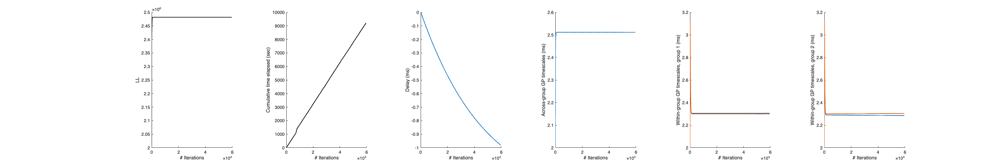

In [11]:
%plot -s 3000,500
% Plot training progress of various quantities. These plots can help with
% troubleshooting, if necessary.
plotFittingProgress(res, ...
                    'freqLL', freqLL, ...
                    'freqParam', freqParam, ...
                    'units', 'ms');

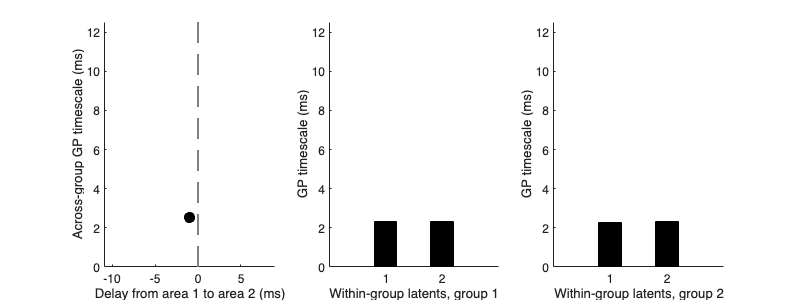

In [12]:
%plot -s 800,300
% Plot estimated and ground truth delays and across-group GP timescales
% together on the same plot. For these scatterplots, it's more
% straightforward to match ground truth latents to corresponding
% estimates.
plotGPparams_dlag(res.estParams, res.binWidth,...
                  res.rGroups, 'units', 'ms');

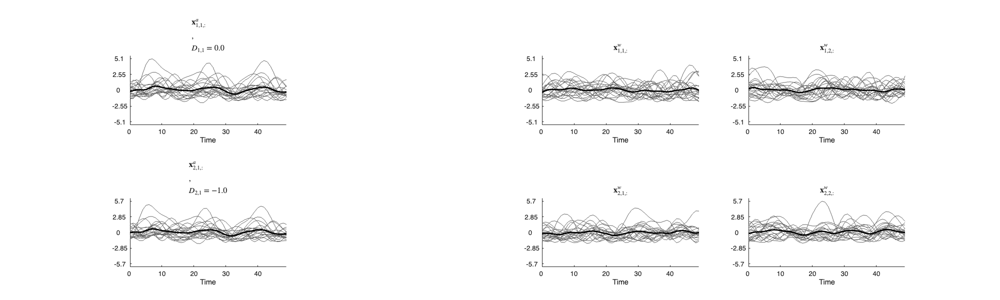

In [13]:
%plot -s 2000,600
% Plot estimated latents
[seqTrain, ~] = exactInferenceWithLL_dlag(data, res.estParams);
plotDimsVsTime_dlag(seqTrain, 'xsm', res.estParams, res.binWidth, ...
                  'nPlotMax', 20, ...
                  'plotSingle', true, ...
                  'plotMean', true, ...
                  'units', []);

In [14]:
groupSeq = partitionObs(seqTrain, xDim_total, 'datafield', 'xsm');

In [15]:
[latent_across_1, latent_within_1] = partitionLatents_meanOnly(groupSeq{1}, ...
    xDim_across, xDim_within(1), 'xpec', 'xsm');

In [16]:
[latent_across_2, latent_within_2] = partitionLatents_meanOnly(groupSeq{2}, ...
    xDim_across, xDim_within(2), 'xpec', 'xsm');

In [17]:
latent_across_1 = cat(3,latent_across_1.xsm);
latent_across_2 = cat(3,latent_across_2.xsm);

In [18]:
latent_across = cat(2, latent_across_1, latent_across_2);

In [19]:
latent_sigma = cellfun(@(x) cov(squeeze(x)'), ...
    num2cell(latent_across, [2 3]), 'UniformOutput', false);


cb = 

  ColorBar with properties:

    Location: 'layout'
      Limits: [0 2]
    FontSize: 9
    Position: [0.9268 0.1100 0.0164 0.8150]
       Units: 'normalized'

  Use GET to show all properties



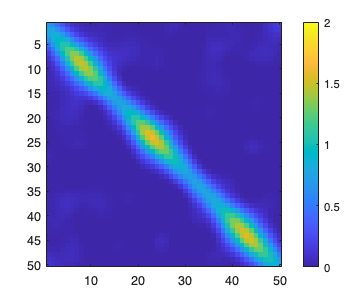

In [21]:
%plot -s 350,300
tcl = tiledlayout(1,1);
for i = 1:1
    nexttile()
    imagesc(latent_sigma{i}(1:num_time,num_time+1:2*num_time))
    caxis([0 2])
end
cb = colorbar(); 
cb.Layout.Tile = 'east'

In [22]:
latent_rho = cellfun(@(x) corrcoef(squeeze(x)'), ...
    num2cell(latent_across, [2 3]), 'UniformOutput', false);

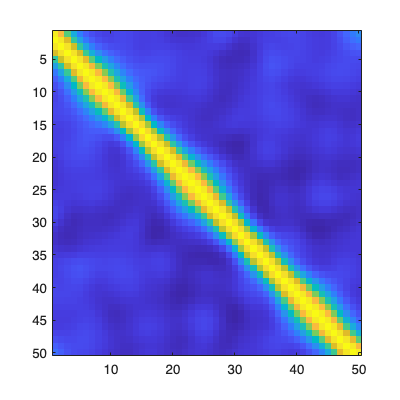

In [24]:
%plot -s 400,400
for i = 1:1
    subplot(1,1,i)
    imagesc(latent_rho{i}(1:num_time,num_time+1:2*num_time))
end

In [25]:
groupParams = partitionParams_dlag(res.estParams);

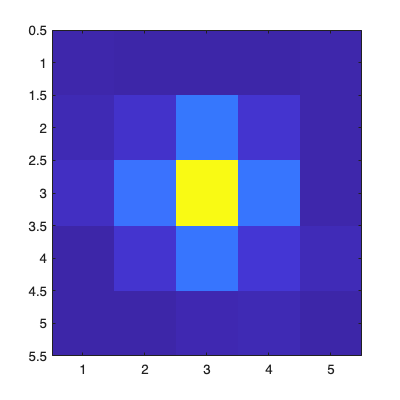

In [26]:
%plot -s 400,400
for i = 1:xDim_across
    subplot(1,1,i)
    imagesc(abs(reshape(groupParams{1}.C(:,i), 5, 5)))
end

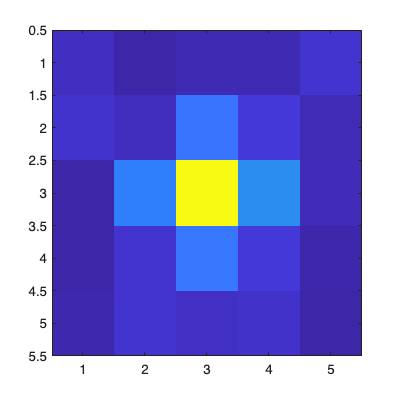

In [27]:
%plot -s 400,400
for i = 1:xDim_across
    subplot(1,1,i)
    imagesc(abs(reshape(groupParams{2}.C(:,i), 5, 5)))
end

In [28]:
latent_sigma


latent_sigma =

  1×1 cell array

    {100×100 double}



In [29]:
Sigma_DLAG = latent_sigma;
latent_DLAG = latent_across;
C_0 = groupParams{1}.C(:,1:3);
C_1 = groupParams{2}.C(:,1:3);
save(sprintf('%s/result_simulation_11_DLAG_single.mat', data_dir), 'Sigma_DLAG', 'latent_DLAG', 'C_0', 'C_1')